<a href="https://colab.research.google.com/github/loveniatheresia/folium_project_n3ts/blob/main/Lovenia_Theresia_X_5_Kota_Manado.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Template Tugas Project

1. import folium, pandas, geopandas, dan drive.
2. load data shapefile, pilih kota/kabupaten yang akan dianalisis
3. load data csv dan proses merge/join data
4. load peta choropleth

In [ ]:
# Import Library

import folium
import pandas as pd
import geopandas as gpd
from google.colab import drive

Pilih nama kota / kabupaten kalian. jika tidak muncul pastikan namanya sesuai dengan nama di link berikut :
https://geoservices.big.go.id/portal/apps/webappviewer/index.html?id=cb58db080712468cb4bfd408dbde3d70

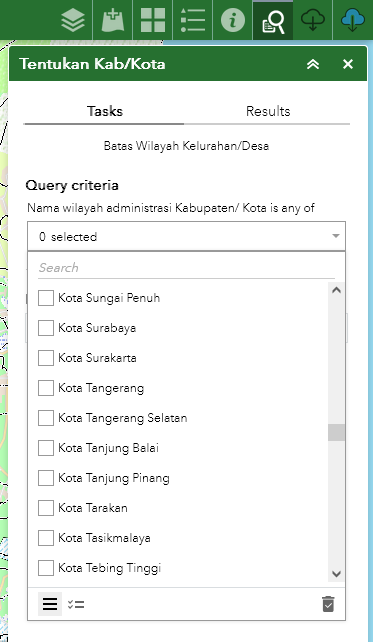

In [ ]:
# Read Data Shapefile

drive.mount('/content/drive')

# Shapefile Admin Indonesia (tidak usah diubah2) Warning! File besar 1.4gb
indonesia_admin = gpd.read_file('/content/drive/MyDrive/ADMIN_INDO/ADMINISTRASI_AR_DESAKEL_10K.shp')

# Pilih Kota/Kabupaten yang ingin ditampilkan, contoh 'Kota Tangerang Selatan'
aoi_admin = indonesia_admin[indonesia_admin['WADMKK'] == 'Kota Manado']

Mounted at /content/drive


In [ ]:
# CSV file path
csv_path = '/content/manado_kecamatan_KK.csv'

# Read shapefile
admin_gdf = aoi_admin

# Read CSV data
csv_data = pd.read_csv(csv_path)

print(csv_data.head())
print(admin_gdf.head())
# Convert column names to lowercase
csv_data['Kecamatan'] = csv_data['Kecamatan'].str.lower().str.replace(' ', '')
admin_gdf['WADMKC'] = admin_gdf['WADMKC'].str.lower().str.replace(' ', '')
#csv_data['Jumlah_KK'] = csv_data['Jumlah_KK'].astype(str).str.replace('.', '')
#csv_data['Jumlah_KK'] = pd.to_numeric(csv_data['Jumlah_KK'])

# Fix typo to merge properly
#admin_gdf['NAMOBJ'] = admin_gdf['NAMOBJ'].str.replace('pondokjagungt', 'pondokjagung')
#csv_data['Kelurahan'] = csv_data['Kelurahan'].str.replace('perigibaru', 'parigibaru')

# Merge data
merged_data = pd.merge(admin_gdf, csv_data, left_on='WADMKC', right_on='Kecamatan', how='left')

# Convert to GeoDataFrame
merged_gdf = gpd.GeoDataFrame(merged_data, geometry=merged_data.geometry)

print(merged_gdf.head())
# Now you can use merged_gdf for further analysis and visualization

    Kecamatan  Kepala Keluarga  Unnamed: 2  Unnamed: 3 Unnamed: 4
0  Malalayang           62.202         NaN         NaN        NaN
1       Sario           21.724         NaN         NaN        NaN
2       Wanea           59.829         NaN         NaN        NaN
3      Wenang           32.633         NaN         NaN        NaN
4      Tikala           30.196         NaN         NaN        NaN
       OBJECTID       NAMOBJ       FCODE  \
65554   65555.0  Alung Banua  BA03070040   
65563   65564.0         Bahu  BA03070040   
65564   65565.0      Bailang  BA03070040   
65569   65570.0       Banjer  BA03070040   
65574   65575.0    Batu Kota  BA03070040   

                                                  REMARK  \
65554  Hasil Delineasi Batas Bapelitbang Kota Manado ...   
65563  Hasil Delineasi Batas Bapelitbang Kota Manado ...   
65564  Hasil Delineasi Batas Bapelitbang Kota Manado ...   
65569  Hasil Delineasi Batas Bapelitbang Kota Manado ...   
65574  Hasil Delineasi Batas Bapelitban

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
# Create a base map1.4752300743216913, 124.8402325036074
m = folium.Map(location=[1.4752300743216913, 124.8402325036074], zoom_start=11)

# Create a choropleth map
choropleth = folium.Choropleth(
    geo_data=merged_gdf,
    name='choropleth',
    data=merged_gdf,
    columns=["Kecamatan", "Kepala Keluarga"],
    key_on= "feature.properties.WADMKC",
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=1,
    legend_name="Jumlah KK"
).add_to(m)

jumlah_KK = folium.GeoJson(
    data=merged_gdf,
    name='Jumlah_KK',
    style_function=lambda feature: {'fillOpacity': 0, 'color': 'transparent'},
    popup = folium.GeoJsonPopup(
        fields=['WADMKC','Kepala Keluarga'],
        aliases=['Kecamatan','Jumlah KK']
    )
).add_to(choropleth)

folium.LayerControl().add_to(m)


m

In [ ]:
# Create a base map
m = folium.Map(location=[1.4752300743216913, 124.8402325036074], zoom_start=13)

# Create a choropleth map
choropleth = folium.Choropleth(
    geo_data=merged_gdf,
    name="Jumlah KK Kecamatan Kota Manado",
    data=merged_gdf,
    columns=["Kecamatan", "Kepala Keluarga"],
    key_on= "feature.properties.WADMKC",
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=1,
    legend_name="Kepala Keluarga"
).add_to(m)

# Create/import data sma
data_sma = pd.read_csv('SMAN Kota Manado.csv')

data_sma['geometry'] = gpd.GeoSeries.from_wkt(data_sma['WKT'])

# Extract latitude and longitude from Point geometries
data_sma['latitude'] = data_sma['geometry'].apply(lambda x: x.y)
data_sma['longitude'] = data_sma['geometry'].apply(lambda x: x.x)

# Add markers to the map
# Create a marker layer
marker_layer = folium.FeatureGroup(name="SMAN Kota Manado")

# Add markers to the layer
for i in range(0, len(data_sma)):
    folium.Marker([data_sma.iloc[i]['latitude'], data_sma.iloc[i]['longitude']], popup=data_sma.iloc[i]['nama']).add_to(marker_layer)

m.add_child(marker_layer)

# Add Jumlah_KK layer map
jumlah_KK = folium.GeoJson(
    data=merged_gdf,
    name='Penduduk',
    style_function=lambda feature: {'fillOpacity': 0, 'color': 'transparent'},
    popup = folium.GeoJsonPopup(
        fields=['WADMKC','Kepala Keluarga'],
        aliases=['Kecamatan','Kepala Keluarga']
    )
).add_to(choropleth)

folium.LayerControl().add_to(m)


m

Analysis Question:
Kelurahan mana yang memiliki jumlah KK dengan kelas tertinggi (Merah Tua)?

Jawab: Kecamatan Mapanget

Kelurahan apa saja yang tidak terdapat Sekolah Negeri?

Jawab: Kecamatan Bunaken, kecamatan Singkil